In [ ]:
!pip install shap

In [ ]:
import os
import glob
import torch
import torch.nn as nn
from torch.utils import data
import numpy as np
import torchvision
from torchvision.transforms.transforms import ToPILImage
from torchvision import transforms, datasets
import cv2 
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

In [ ]:
model_vgg = torchvision.models.vgg16(weights="IMAGENET1K_V1") 
model_resnet = torchvision.models.resnet50(weights="IMAGENET1K_V1") 
model_densenet = torchvision.models.densenet121(weights="IMAGENET1K_V1")

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 83.1MB/s]
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 82.5MB/s]
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 87.3MB/s]


In [ ]:
path = "/content/drive/MyDrive/ImageNet50/images"

In [ ]:
im_paths = os.listdir(path)

In [ ]:
# sort list 
from natsort import natsorted 
im_paths = natsorted(im_paths)

In [ ]:
transform = transforms.Compose([transforms.Resize((224, 224)), 
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])


In [ ]:
import pandas as pd

label_df = pd.read_excel("/content/ImageNet1k.xlsx")
label_df.head()

,Class ID,Class Name
0,0,"tench, Tinca tinca"
1,1,"goldfish, Carassius auratus"
2,2,"great white shark, white shark, man-eater, man..."
3,3,"tiger shark, Galeocerdo cuvieri"
4,4,"hammerhead, hammerhead shark"


In [ ]:
def get_heatmap(cam, d):

  path = "/content/drive/MyDrive/ImageNet50/"
  img = np.array(Image.open(path + f"im_{d}.png"))

  # resize to image shape
  cam_resized = cv2.resize(cam, (img.shape[1], img.shape[0]))

  heatmap = cv2.applyColorMap(np.uint8(cam_resized), cv2.COLORMAP_JET)

  img_cam_merge = img*0.7 + heatmap*0.3

  return img_cam_merge, heatmap

In [ ]:
def compute_cam(model, im_paths, model_name="vgg"):
  
  activation = []
  grad = []

  def forward_hook(module,input,output):
    activation.append(output)
      
  def backward_hook(module,grad_in,grad_out):
    grad.append(grad_out[0])

  predictions = []
  labels = []
  confidence = []
  img_cams = []
  heatmaps = []

  for i,d in enumerate(im_paths):
    
    # path
    path = "/content/drive/MyDrive/ImageNet50/images/" + d + "/"

    # create data loader
    dataset = datasets.ImageFolder(root=path, transform=transform)
    dataloader = data.DataLoader(dataset=dataset, shuffle=False, batch_size=1)
    
    model.eval()

    if model_name == "vgg" or model_name == "densenet":
      model.features[-1].register_forward_hook(forward_hook)
      model.features[-1].register_backward_hook(backward_hook)

    elif model_name == "resnet":
      model.layer4[-1].register_forward_hook(forward_hook)
      model.layer4[-1].register_backward_hook(backward_hook)
    
    else:
      print("error in name, available models: vgg, densenet, resnet")

    img, _ = next(iter(dataloader))
    pred = model(img)

    top_1 = torch.argmax(pred).item()
    label = label_df[label_df["Class ID"] == top_1].to_numpy()[0][1]

    # get loss for the top 1 label
    loss = pred[0, top_1]

    # zeroing out all gradients
    model.zero_grad()

    # backward step to get gradients
    loss.backward()

    # gradients and activations
    grads = grad[0].cpu().data.numpy().squeeze()
    fmap = activation[0].cpu().data.numpy().squeeze()
    tmp = grads.reshape([grads.shape[0],-1])

    # average out -- change this step for gradcam++
    weights = np.mean(tmp,axis=1)
    cam = np.zeros(grads.shape[1:])

    for i,w in enumerate(weights):
      cam += w*fmap[i,:]
    
    cam = (cam>0)*cam
    cam = cam/cam.max()*255

    cams, maps = get_heatmap(cam, d)

    img_cams.append(cams)
    heatmaps.append(maps)

    for f in glob.glob(path + "*.png"):
      im_name = f

      print(top_1, label)
      predictions.append(top_1)
      labels.append(label)
      confidence.append(torch.max(pred, dim=1).values.detach().item())

      # im = cv2.imread(im_name)
      im = Image.fromarray(np.uint8(cams[:,:,::-1]))
      display(im)

      activation = []
      grad = []


  return predictions, labels, confidence, img_cams, heatmaps

In [ ]:
vgg_pred, vgg_labels, vgg_confidence, vgg_img_cams, vgg_heatmaps = compute_cam(model_vgg, im_paths, model_name="vgg")

In [ ]:
res_pred, res_labels, res_confidence, res_img_cams, res_heatmaps = compute_cam(model_resnet, im_paths, model_name="resnet")

716 picket fence, paling


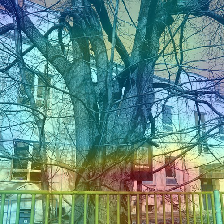

132 American egret, great white heron, Egretta albus


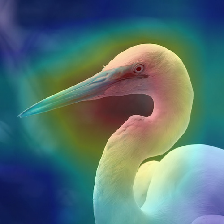

814 speedboat


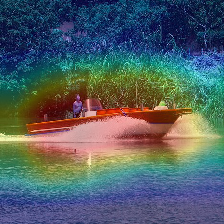

746 puck, hockey puck


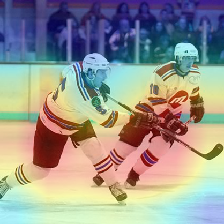

42 agama


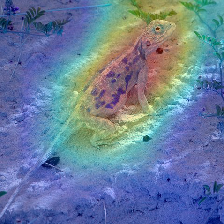

634 lumbermill, sawmill


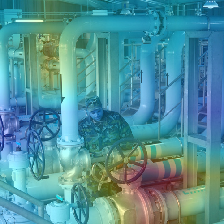

738 pot, flowerpot


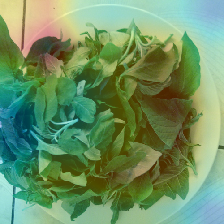

643 mask


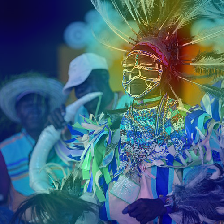

831 studio couch, day bed


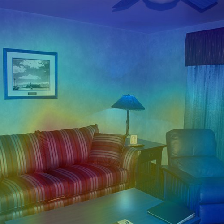

976 promontory, headland, head, foreland


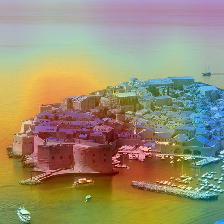

807 solar dish, solar collector, solar furnace


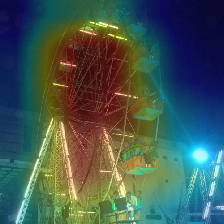

133 bittern


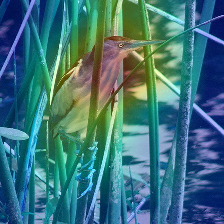

918 crossword puzzle, crossword


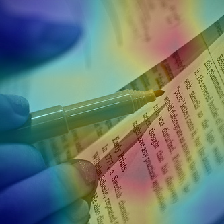

109 brain coral


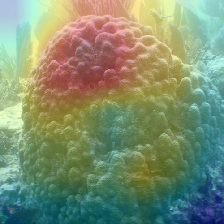

346 water buffalo, water ox, Asiatic buffalo, Bubalus bubalis


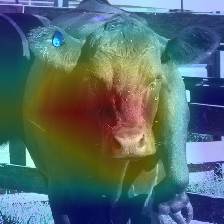

984 rapeseed


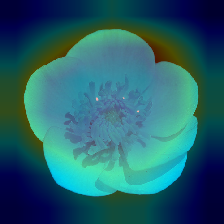

706 patio, terrace


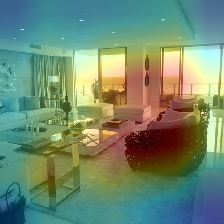

341 hog, pig, grunter, squealer, Sus scrofa


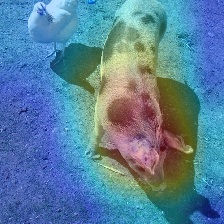

949 strawberry


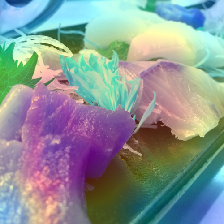

895 warplane, military plane


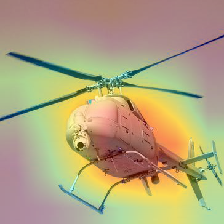

928 ice cream, icecream


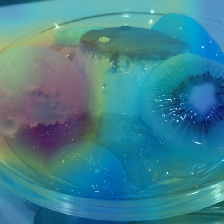

933 cheeseburger


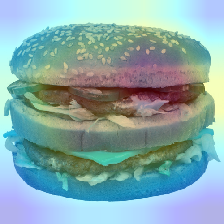

930 French loaf


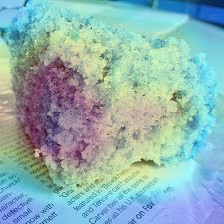

970 alp


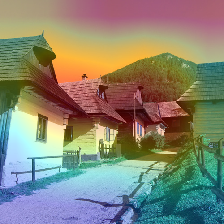

32 tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui


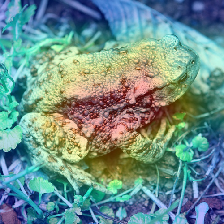

608 jean, blue jean, denim


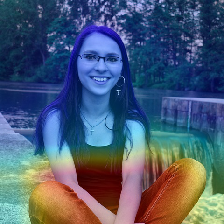

16 bulbul


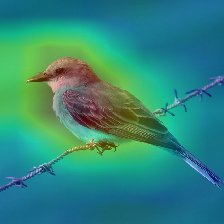

840 swab, swob, mop


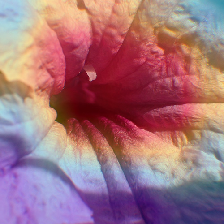

78 tick


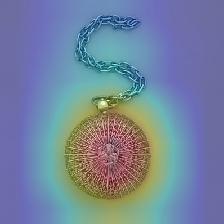

872 tripod


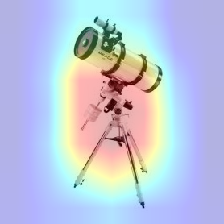

339 sorrel


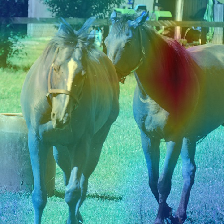

950 orange


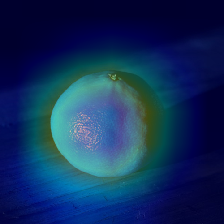

738 pot, flowerpot


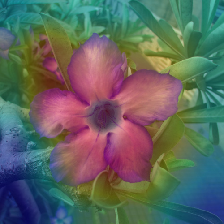

587 hammer


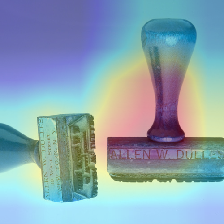

815 spider web, spider's web


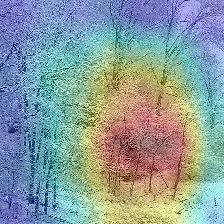

24 great grey owl, great gray owl, Strix nebulosa


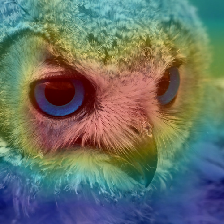

461 breastplate, aegis, egis


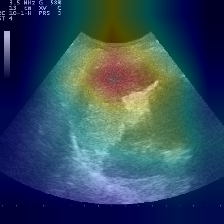

611 jigsaw puzzle


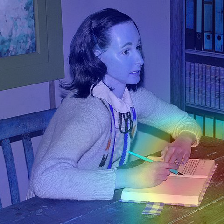

834 suit, suit of clothes


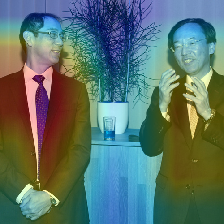

142 dowitcher


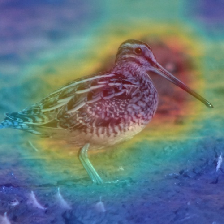

440 beer bottle


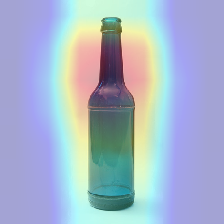

299 meerkat, mierkat


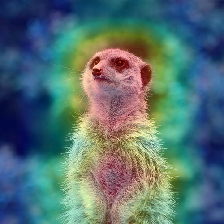

688 oscilloscope, scope, cathode-ray oscilloscope, CRO


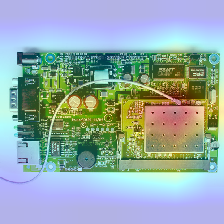

452 bonnet, poke bonnet


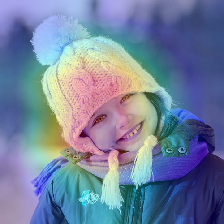

430 basketball


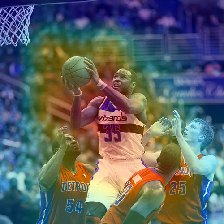

997 bolete


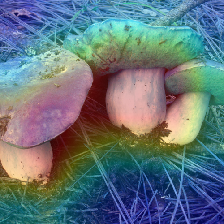

527 desktop computer


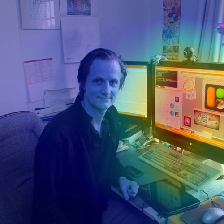

885 velvet


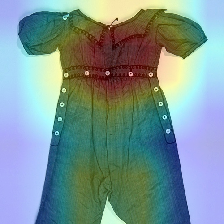

709 pencil box, pencil case


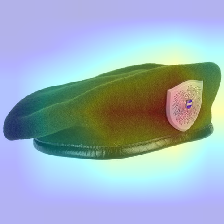

895 warplane, military plane


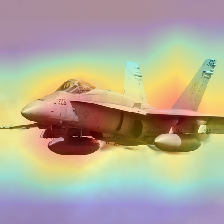

In [ ]:
dense_pred, dense_labels, dense_confidence, dense_img_cams, dense_heatmaps = compute_cam(model_densenet, im_paths, model_name="densenet")

In [ ]:
def create_masks_occl_from_heatmaps(heatmaps, file_name:str):

  path = "/content/drive/MyDrive/ImageNet50/"
  masks = []
  occl = []

  i = 0

  for h in heatmaps:
    h = h[:,:,::-1] # RGB to BGR
    h = h[:, :, 2] # Red channel only

    occl.append(np.array(Image.fromarray(255 - h.astype(np.uint8)).convert("RGB")))
    # display(Image.fromarray(255 - h.astype(np.uint8)).convert("RGB"))
    # h_gray = Image.fromarray(h.astype(np.uint8)).convert("L")
    # h_gray = Image.fromarray(np.array(255 - np.array(h_gray))).convert("RGB") # 3 channels
    # masks.append(h_gray) 
    h = h.astype(float)

    # normalize
    h -= np.mean(h)
    h /= np.std(h)

    h = np.array(Image.fromarray(h.astype(np.uint8)).convert("RGB"))

    # h = np.array(Image.fromarray(255 - h.astype(np.uint8)).convert("RGB"))

    # display(Image.fromarray(h))
    
    masks.append(h)
    Image.fromarray(h).save(path + file_name + f"/im_{i}.png")
    i += 1

  return masks, occl


In [ ]:
vgg_masks, vgg_occl = create_masks_occl_from_heatmaps(vgg_heatmaps, "vgg_masks")
res_masks, res_occl = create_masks_occl_from_heatmaps(res_heatmaps, "res_masks")
dense_masks, dense_occl = create_masks_occl_from_heatmaps(dense_heatmaps, "dense_masks")

In [ ]:
def multiply_img_mask(masks, file_name : str, invert=False):

  # get list of images
  path = "/content/drive/MyDrive/ImageNet50/"

  perturbed_imgs = []

  for i in range(50):
    im_path = path + f"im_{i}.png"
    im = Image.open(im_path).convert("RGB")
    im = np.array(im)


    if invert is True:
      masks[i] = 255 - masks[i]
    
    mult_img = np.multiply(im/255, masks[i]/255)

    mult_img_pil = Image.fromarray((mult_img*255).astype(np.uint8))

    perturbed_imgs.append((mult_img*255).astype(np.uint8))

    mult_img_pil.save(path + file_name + f"/im_{i}.png")
  
  return perturbed_imgs


In [ ]:
p_vgg = multiply_img_mask(vgg_occl, "vgg_occl")
p_vgg_inv = multiply_img_mask(vgg_occl, "vgg_occl_inv", invert=True)

In [ ]:
p_res = multiply_img_mask(res_occl, "res_occl")
p_res_inv = multiply_img_mask(res_occl, "res_occl_inv", invert=True)

In [ ]:
p_dense = multiply_img_mask(dense_occl, "dense_occl")
p_dense_inv = multiply_img_mask(dense_occl, "dense_occl_inv", invert=True)

In [ ]:
def get_new_confidence(model, file_name, predictions):

  path = "/content/drive/MyDrive/ImageNet50/"
  new_confs = []

  ctr_incorrect = 0

  for i in range(50):
    im_path = path + file_name + f"/im_{i}.png"

    im = Image.open(im_path)
    im = transform(im).unsqueeze(0)

    model.eval()

    with torch.no_grad():
      pred = model(im)
      top_1 = torch.argmax(pred).item()
      conf = torch.max(pred, dim=1).values.item()

      if top_1 != predictions[i]: # checking if confidence drops even if the label is incorrect
        label = label_df[label_df["Class ID"] == top_1].to_numpy()[0][1]
        label2 = label_df[label_df["Class ID"] == predictions[i]].to_numpy()[0][1]
        conf = pred[0, predictions[i]]
        # print(label, label2)
        ctr_incorrect += 1
      
      new_confs.append(conf)
  
  print(file_name, " | ", ctr_incorrect)

  return new_confs

In [ ]:
vgg_p_conf = get_new_confidence(model_vgg, "vgg_occl", vgg_pred)
vgg_p_conf_inv = get_new_confidence(model_vgg, "vgg_occl_inv", vgg_pred)

vgg_occl  |  37
vgg_occl_inv  |  33


In [ ]:
res_p_conf = get_new_confidence(model_resnet, "res_occl", res_pred)
res_p_conf_inv = get_new_confidence(model_resnet, "res_occl_inv", res_pred)

res_occl  |  25
res_occl_inv  |  44


In [ ]:
dense_p_conf = get_new_confidence(model_densenet, "dense_occl", dense_pred)
dense_p_conf_inv = get_new_confidence(model_densenet, "dense_occl_inv", dense_pred)

dense_occl  |  17
dense_occl_inv  |  44


In [ ]:
# ref: Grad-CAM++ https://arxiv.org/pdf/1710.11063.pdf

def get_gradcam_metrics(conf_og, conf_occ):

  drop_in_confidence = []
  conf_og = np.array(conf_og)
  conf_occ = np.array(conf_occ)

  sum = 0

  for i in range(len(conf_og)):
    # print(conf_og[i])
    Max = max(0, conf_og[i] - conf_occ[i])
    avg = Max / conf_og[i]
    #print(avg)
    drop_in_confidence.append(avg)
    # sum += avg

  avg_increase = 0

  for i, x in enumerate(zip(conf_og, conf_occ)): # avg increase

    if x[0] < x[1]:
      # print(i)
      avg_increase += 1
    
  # print(avg_increase/50)

  return np.mean(drop_in_confidence), avg_increase/50

In [ ]:
vgg_metrics = get_gradcam_metrics(vgg_confidence, vgg_p_conf)

print("Mean drop in confidence: ", vgg_metrics[0], " Mean increase in confidence: ", vgg_metrics[1])

Mean drop in confidence:  0.36082833272347464  Mean increase in confidence:  0.16


In [ ]:
vgg_metrics_inv = get_gradcam_metrics(vgg_confidence, vgg_p_conf_inv)

# want a drop in confidence

print("Mean drop in confidence: ", vgg_metrics_inv[0], " Mean increase in confidence: ", vgg_metrics_inv[1])

Mean drop in confidence:  0.3310766374200802  Mean increase in confidence:  0.08


In [ ]:
res_metrics = get_gradcam_metrics(res_confidence, res_p_conf)

print("Mean drop in confidence: ", res_metrics[0], " Mean increase in confidence: ", res_metrics[1])

Mean drop in confidence:  0.15644015851739632  Mean increase in confidence:  0.26


In [ ]:
res_metrics_inv = get_gradcam_metrics(res_confidence, res_p_conf_inv)

print("Mean drop in confidence: ", res_metrics_inv[0], " Mean increase in confidence: ", res_metrics_inv[1])

Mean drop in confidence:  0.5672414064171263  Mean increase in confidence:  0.02


In [ ]:
dense_metrics = get_gradcam_metrics(dense_confidence, dense_p_conf)

print("Mean drop in confidence: ", dense_metrics[0], " Mean increase in confidence: ", dense_metrics[1])

Mean drop in confidence:  0.151345389663592  Mean increase in confidence:  0.14


In [ ]:
dense_metrics_inv = get_gradcam_metrics(dense_confidence, dense_p_conf_inv)

print("Mean drop in confidence: ", dense_metrics_inv[0], " Mean increase in confidence: ", dense_metrics_inv[1])

Mean drop in confidence:  0.5073207599767662  Mean increase in confidence:  0.02


In [ ]:
!pip install grad-cam

In [ ]:
from pytorch_grad_cam.metrics.road import ROADMostRelevantFirst, ROADLeastRelevantFirst
from pytorch_grad_cam.utils.image import deprocess_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputSoftmaxTarget
from typing import List, Callable

In [ ]:
def get_ROAD_score(model, occl, preds, percentile=40, percentile2=80, display_ims=True):
  # percentile = 40
  cam_metric = ROADMostRelevantFirst(percentile=percentile)
  cam_metric2 = ROADLeastRelevantFirst(percentile=percentile2)

  to_pytorch_tensor = transforms.Compose([transforms.ToTensor()])

  score_list1 = []
  score_list2 = []

  for i in range(50):
    im_path = f"/content/drive/MyDrive/ImageNet50/im_{i}.png"
    tst_im = Image.open(im_path).convert("RGB")

    input_tensor = to_pytorch_tensor(tst_im)
    input_pil = transforms.ToPILImage()(input_tensor).convert("RGB")
 
    grayscale_cams =  np.array(Image.fromarray(occl[i]).convert("L"))
    grayscale_cams_pil = Image.fromarray(grayscale_cams).convert("RGB")

    grayscale_cams = np.expand_dims(grayscale_cams, axis=0)

    targets = [ClassifierOutputSoftmaxTarget(preds[i])]

    scores, visualizations = cam_metric(input_tensor.unsqueeze(0), grayscale_cams/255, targets, model, return_visualization=True)
    score = scores[0]

    scores2, visualizations2 = cam_metric2(input_tensor.unsqueeze(0), grayscale_cams/255, targets, model, return_visualization=True)
    score2 = scores2[0]

    vis_pil = transforms.ToPILImage()(visualizations.squeeze(0)).convert("RGB")
    vis_pil2 = transforms.ToPILImage()(visualizations2.squeeze(0)).convert("RGB")

    if display_ims:
      print(f"The confidence increase when removing {100-percentile}% of the image: {score}")

      display(Image.fromarray(np.hstack((input_pil, grayscale_cams_pil, vis_pil, vis_pil2))))

    score_list1.append(score)
    score_list2.append(score2)

  return score_list1, score_list2

In [ ]:
# vgg_occl

In [ ]:
vgg_ROAD_scores = get_ROAD_score(model_vgg, 255 - np.array(vgg_occl), vgg_pred, percentile=40)

In [ ]:
res_ROAD_scores = get_ROAD_score(model_resnet, np.array(res_occl), res_pred, percentile=40)

The confidence increase when removing 60% of the image: -0.12979687750339508


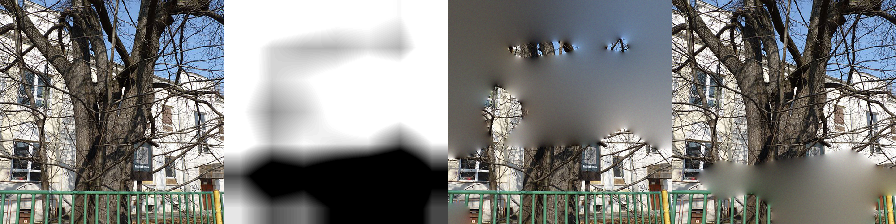

The confidence increase when removing 60% of the image: 0.0022644996643066406


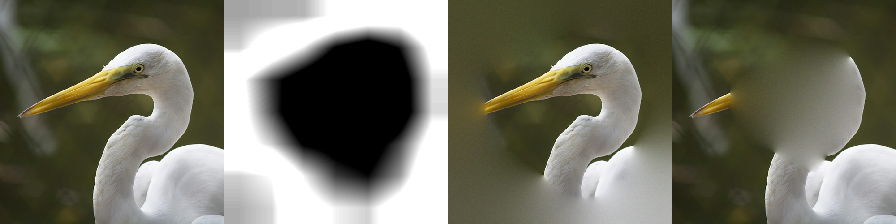

The confidence increase when removing 60% of the image: -0.026612401008605957


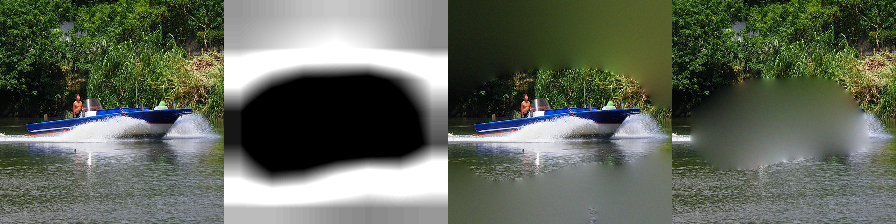

The confidence increase when removing 60% of the image: -0.03422337770462036


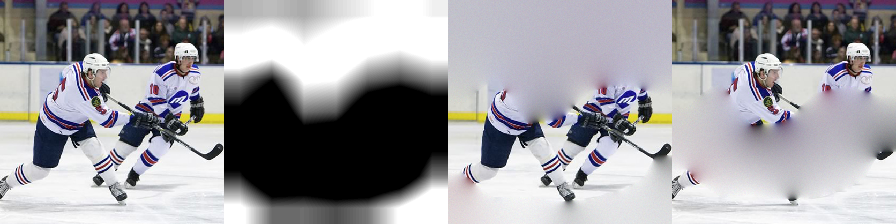

The confidence increase when removing 60% of the image: -0.16228437423706055


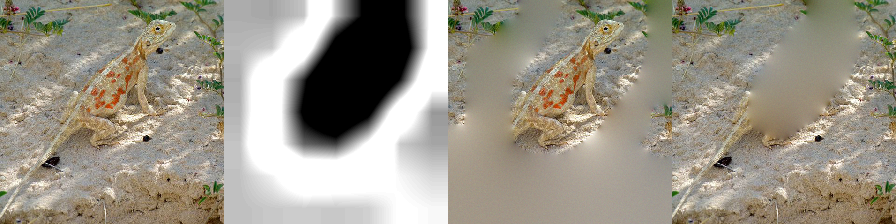

The confidence increase when removing 60% of the image: -0.02141399495303631


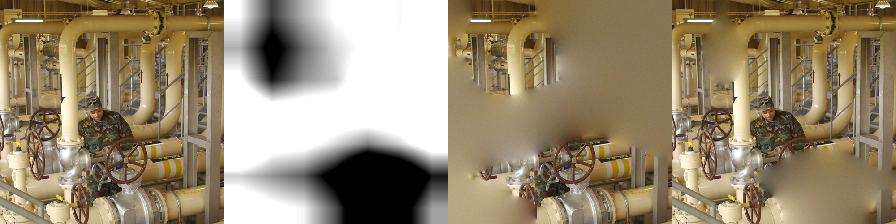

The confidence increase when removing 60% of the image: -0.2877686321735382


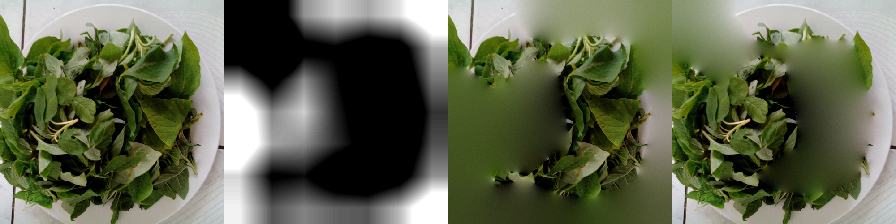

The confidence increase when removing 60% of the image: -0.04907888546586037


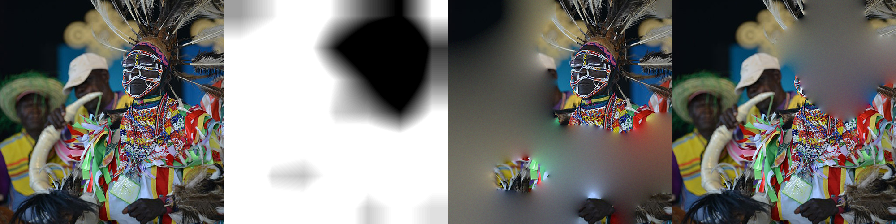

The confidence increase when removing 60% of the image: 0.02936035394668579


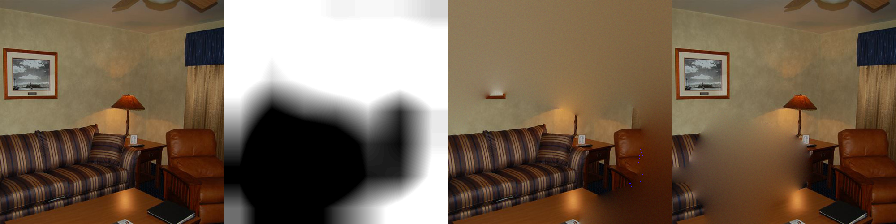

The confidence increase when removing 60% of the image: 0.1740032434463501


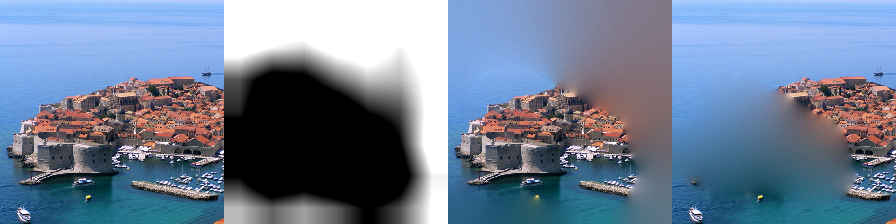

The confidence increase when removing 60% of the image: -0.1669907420873642


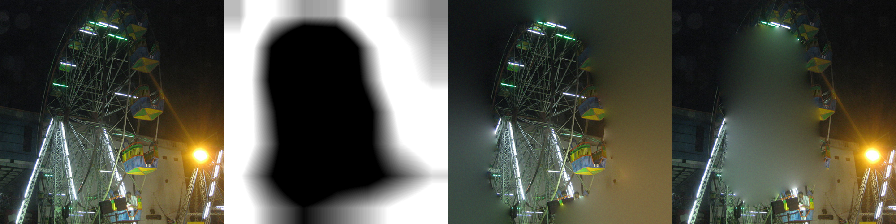

The confidence increase when removing 60% of the image: -0.00427013635635376


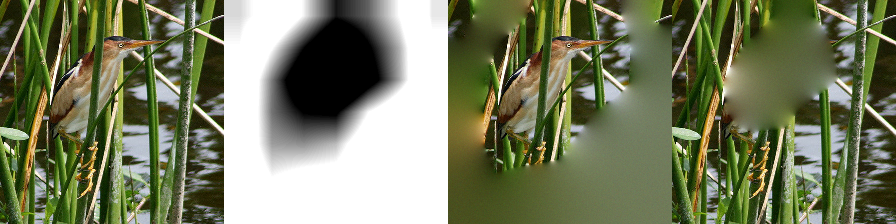

The confidence increase when removing 60% of the image: -0.25373461842536926


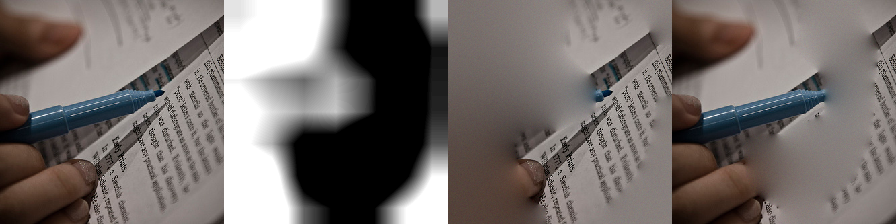

The confidence increase when removing 60% of the image: -0.6060064435005188


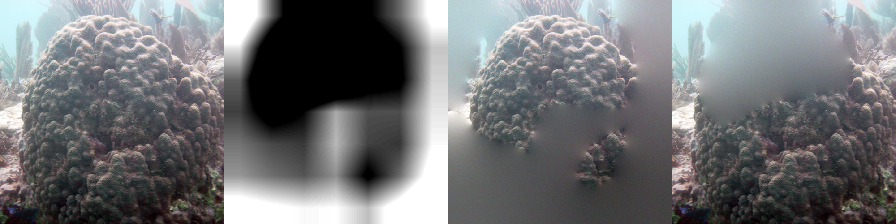

The confidence increase when removing 60% of the image: 0.05259048938751221


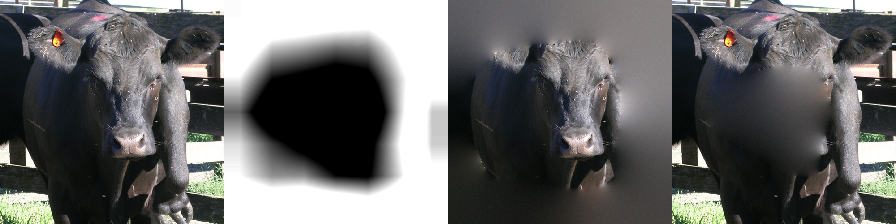

The confidence increase when removing 60% of the image: -0.013182401657104492


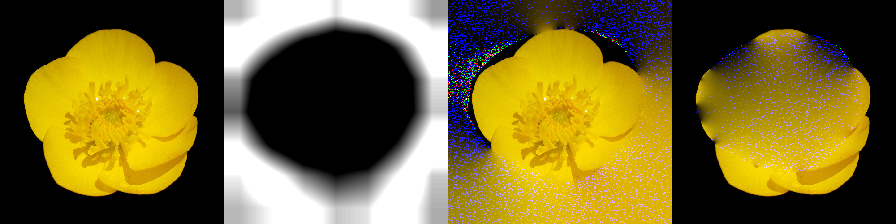

The confidence increase when removing 60% of the image: -0.15836068987846375


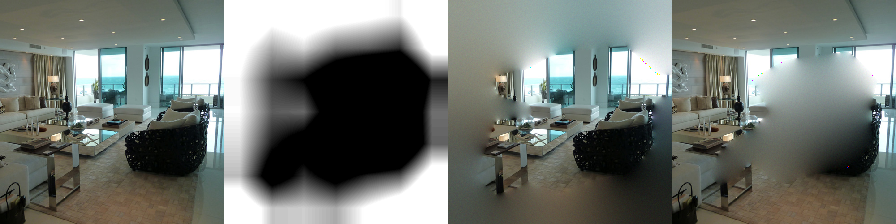

The confidence increase when removing 60% of the image: 0.006546199321746826


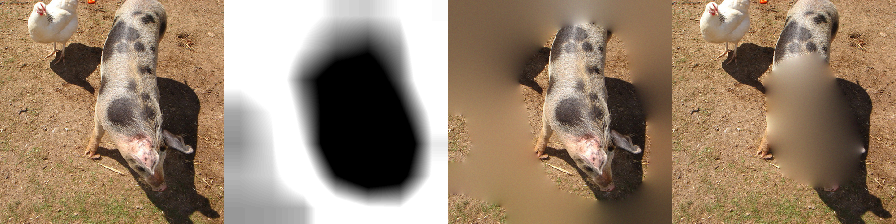

The confidence increase when removing 60% of the image: -0.03543001040816307


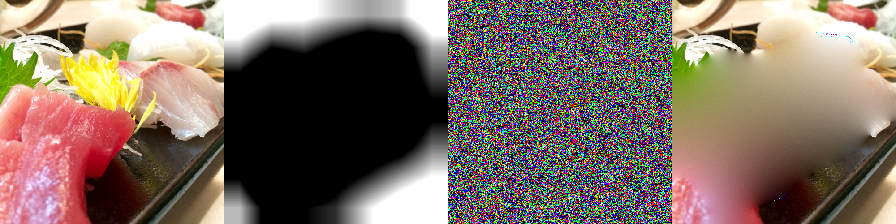

The confidence increase when removing 60% of the image: -0.19465388357639313


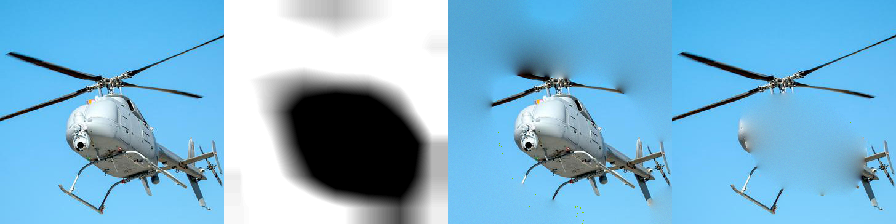

The confidence increase when removing 60% of the image: 0.07506421953439713


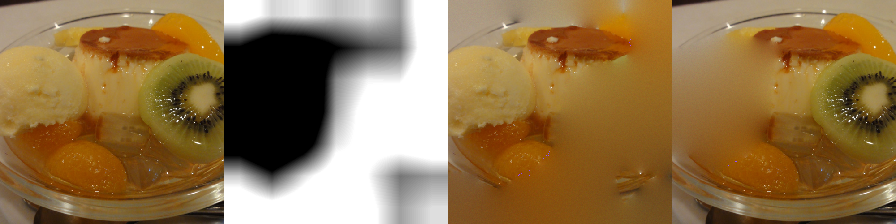

The confidence increase when removing 60% of the image: -0.017969727516174316


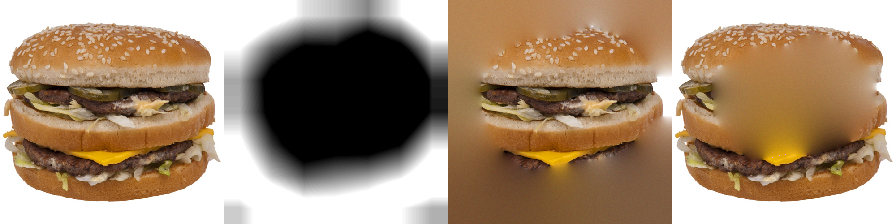

The confidence increase when removing 60% of the image: -0.64199298620224


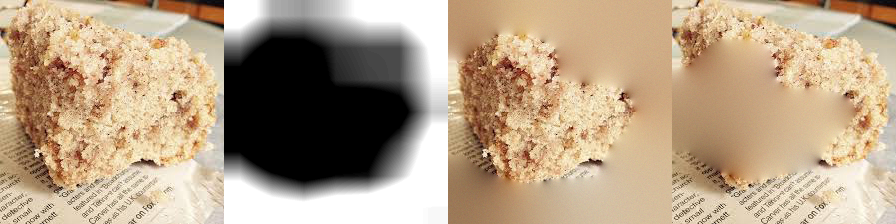

The confidence increase when removing 60% of the image: -0.12228888273239136


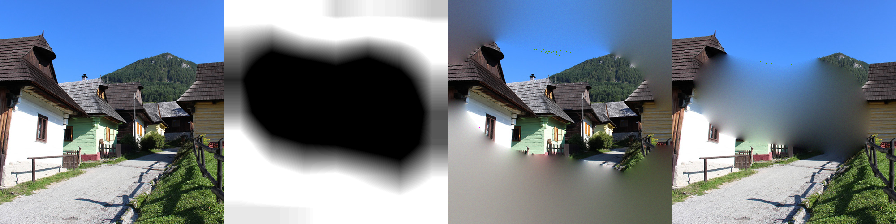

The confidence increase when removing 60% of the image: -0.036785781383514404


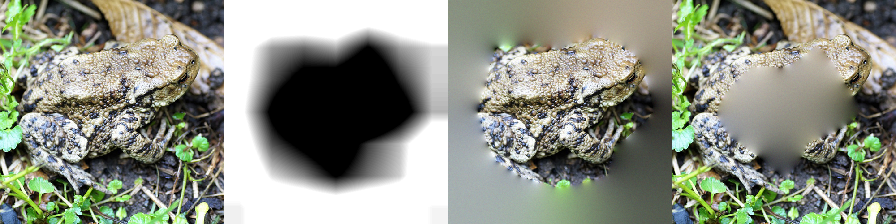

The confidence increase when removing 60% of the image: 0.019270090386271477


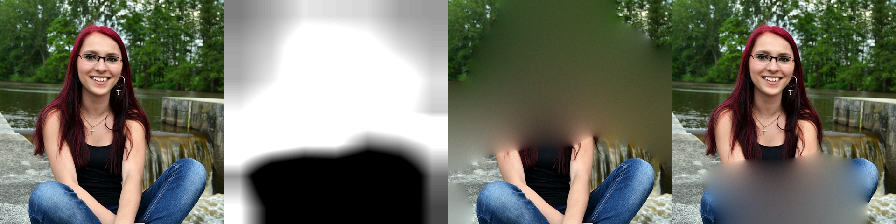

The confidence increase when removing 60% of the image: -0.19936859607696533


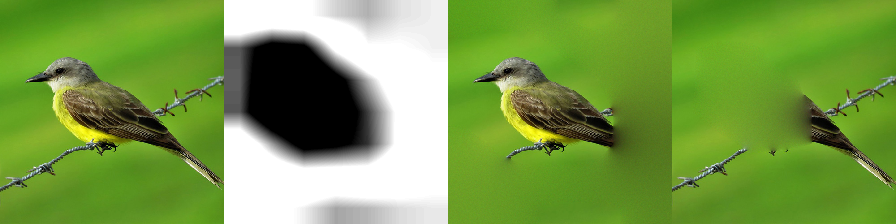

The confidence increase when removing 60% of the image: -0.036599691957235336


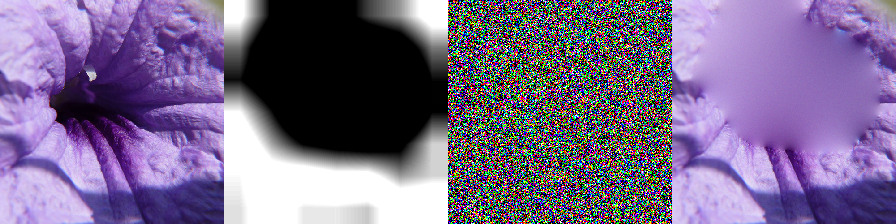

The confidence increase when removing 60% of the image: 0.12250269949436188


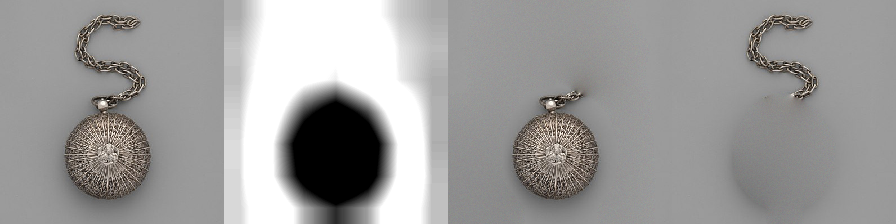

The confidence increase when removing 60% of the image: -0.004159718751907349


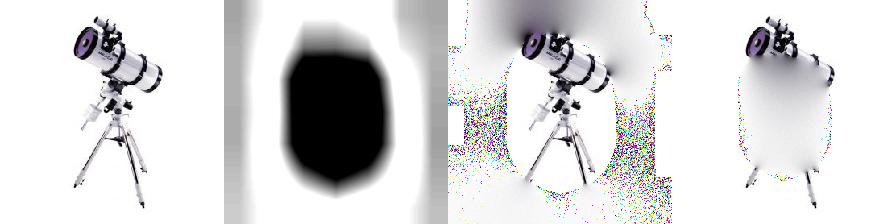

The confidence increase when removing 60% of the image: -0.31807243824005127


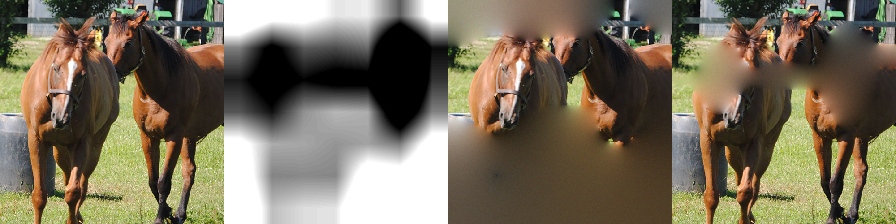

The confidence increase when removing 60% of the image: -0.014511702582240105


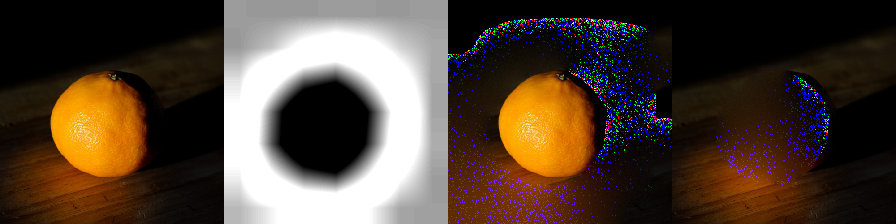

The confidence increase when removing 60% of the image: -0.21045081317424774


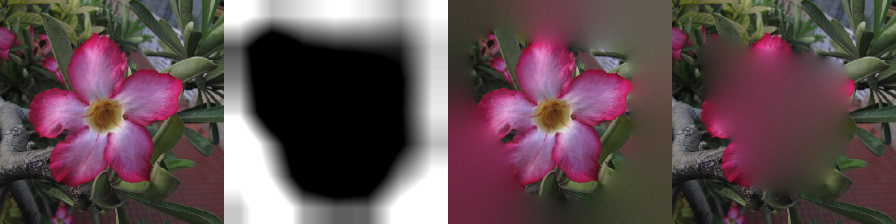

The confidence increase when removing 60% of the image: -0.1092047318816185


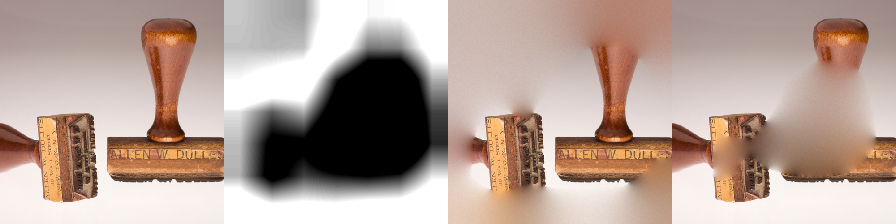

The confidence increase when removing 60% of the image: 0.014287520200014114


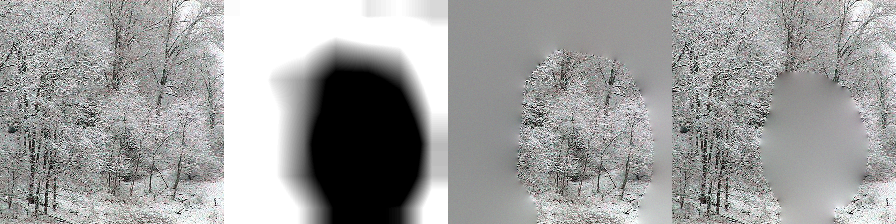

The confidence increase when removing 60% of the image: -0.2341233491897583


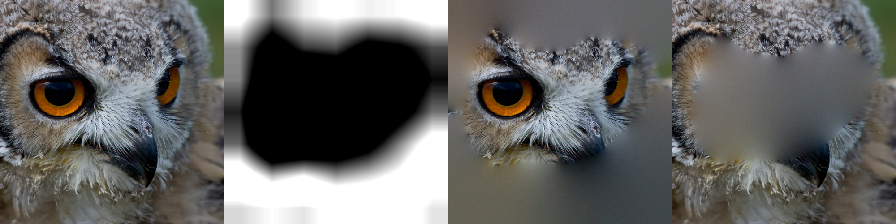

The confidence increase when removing 60% of the image: -0.00056513148592785


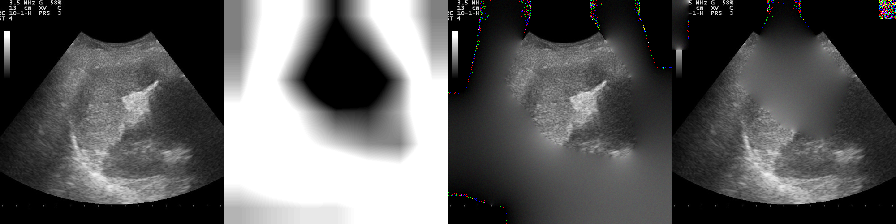

The confidence increase when removing 60% of the image: -0.5016023516654968


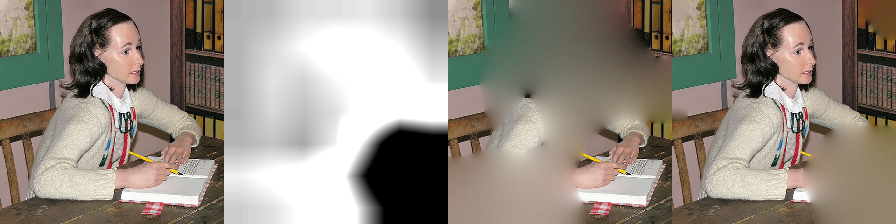

The confidence increase when removing 60% of the image: -0.2605256140232086


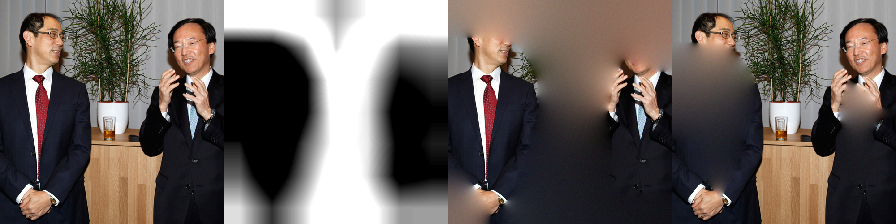

The confidence increase when removing 60% of the image: 0.003921449184417725


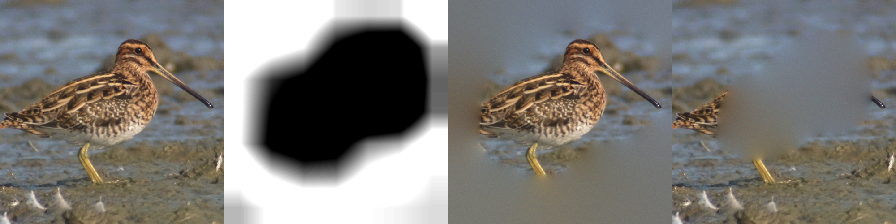

The confidence increase when removing 60% of the image: 0.16164427995681763


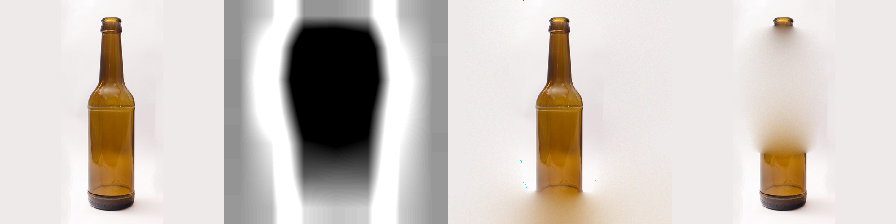

The confidence increase when removing 60% of the image: 0.012406468391418457


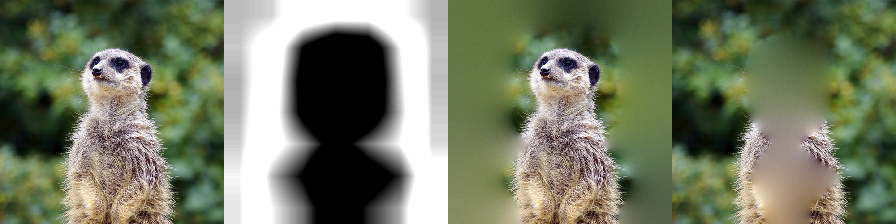

The confidence increase when removing 60% of the image: -0.7086536288261414


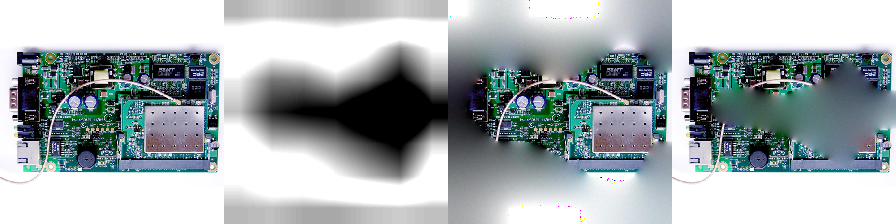

The confidence increase when removing 60% of the image: 0.03291487693786621


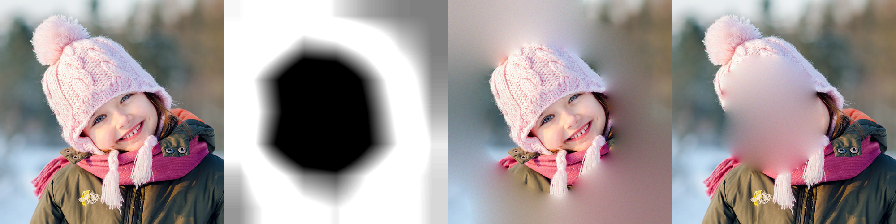

The confidence increase when removing 60% of the image: -0.13566702604293823


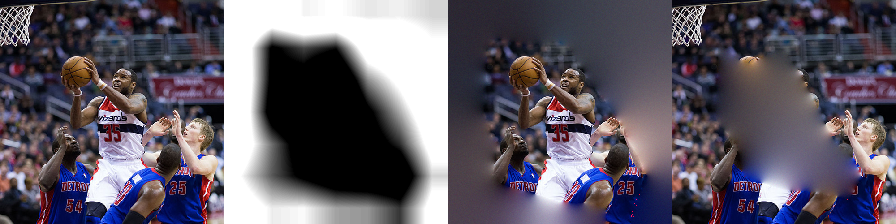

The confidence increase when removing 60% of the image: -0.42214852571487427


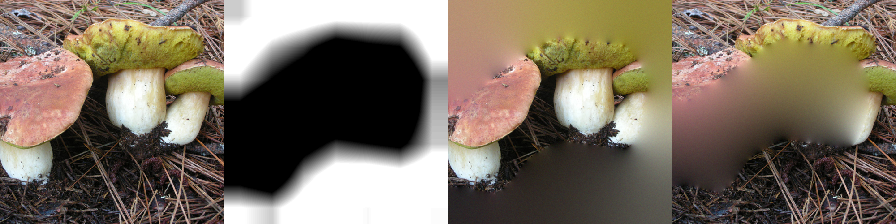

The confidence increase when removing 60% of the image: -0.019898321479558945


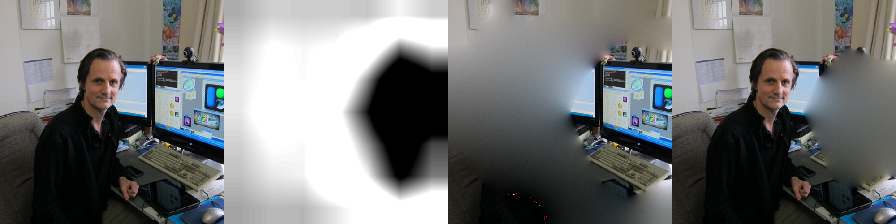

The confidence increase when removing 60% of the image: -0.12258313596248627


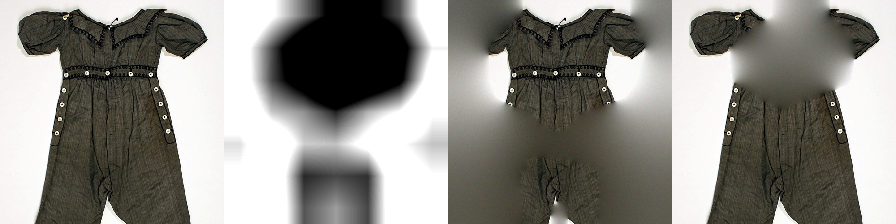

The confidence increase when removing 60% of the image: 0.003895707428455353


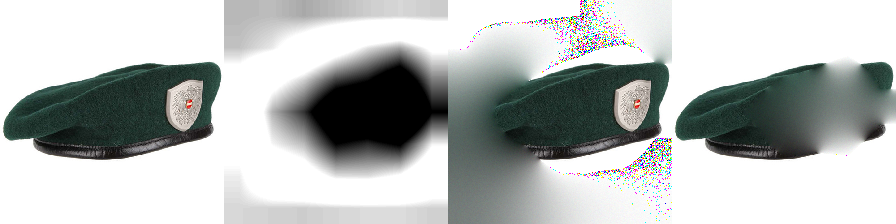

The confidence increase when removing 60% of the image: -0.04139852523803711


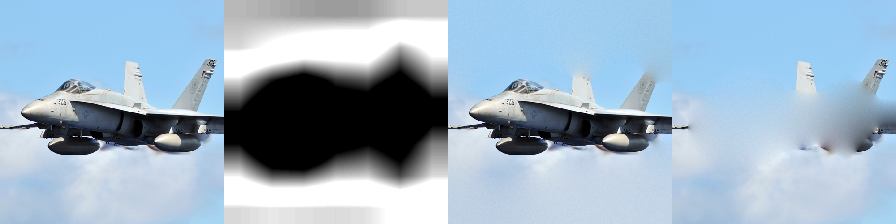

In [ ]:
dense_ROAD_scores = get_ROAD_score(model_densenet, dense_occl, dense_pred, percentile=40)

In [ ]:
## Clearly, the interpolation becomes messy if the percentile is too low.
## Calculating the scores for a percentile of 80

vgg_ROAD_scores = get_ROAD_score(model_vgg, 255 - np.array(vgg_occl), vgg_pred, percentile=80, display_ims=False)
res_ROAD_scores = get_ROAD_score(model_resnet, np.array(res_occl), res_pred, percentile=80, display_ims=False)
dense_ROAD_scores = get_ROAD_score(model_densenet, dense_occl, dense_pred, percentile=80, display_ims=False)


In [ ]:
vgg_avg_mrf = np.mean(vgg_ROAD_scores[0])
vgg_avg_lrf = np.mean(vgg_ROAD_scores[1])
vgg_avg_combined = (vgg_avg_mrf - vgg_avg_lrf)/2

print("Confidence increase when occluding image except areas detected: ", vgg_avg_mrf, "(higher the better)", 
      "\nConfidence increase when occluding image except areas NOT detected: ", vgg_avg_lrf, "(lower the better)", 
      "\nCombined: ", vgg_avg_combined, "(higher the better)")

Confidence increase when occluding image except areas detected:  -0.13330802 (higher the better) 
Confidence increase when occluding image except areas NOT detected:  -0.17782824 (lower the better) 
Combined:  0.022260107100009918 (higher the better)


In [ ]:
res_avg_mrf = np.mean(res_ROAD_scores[0])
res_avg_lrf = np.mean(res_ROAD_scores[1])
res_avg_combined = (res_avg_mrf - res_avg_lrf)/2

print("Confidence increase when occluding image except areas detected: ", res_avg_mrf, "(higher the better)", 
      "\nConfidence increase when occluding image except areas NOT detected: ", res_avg_lrf, "(lower the better)", 
      "\nCombined: ", res_avg_combined, "(higher the better)")

Confidence increase when occluding image except areas detected:  -0.030020243 (higher the better) 
Confidence increase when occluding image except areas NOT detected:  -0.26101425 (lower the better) 
Combined:  0.11549700796604156 (higher the better)


In [ ]:
dense_avg_mrf = np.mean(dense_ROAD_scores[0])
dense_avg_lrf = np.mean(dense_ROAD_scores[1])
dense_avg_combined = (dense_avg_mrf - dense_avg_lrf)/2

print("Confidence increase when occluding image except areas detected: ", dense_avg_mrf, "(higher the better)", 
      "\nConfidence increase when occluding image except areas NOT detected: ", dense_avg_lrf, "(lower the better)", 
      "\nCombined: ", dense_avg_combined, "(higher the better)")

Confidence increase when occluding image except areas detected:  -0.029750912 (higher the better) 
Confidence increase when occluding image except areas NOT detected:  -0.41847968 (lower the better) 
Combined:  0.19436438381671906 (higher the better)


References:
1. GradCAM paper: https://arxiv.org/abs/1710.11063
2. Modified from tutorial: https://medium.com/@stepanulyanin/implementing-grad-cam-in-pytorch-ea0937c31e82 
3. Modified from tutorial: https://colab.research.google.com/drive/1FXgkHZy4rVIURSECRIQtRPhtndvBKYYm?usp=sharing
4. ROAD Metric from: https://github.com/jacobgil/pytorch-grad-cam
